- Import Libraries

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

- Read csv file

In [48]:
df = pd.read_csv("data/AB_NYC_2019.csv")

- Show data frame

In [49]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

### 1. Bar plot

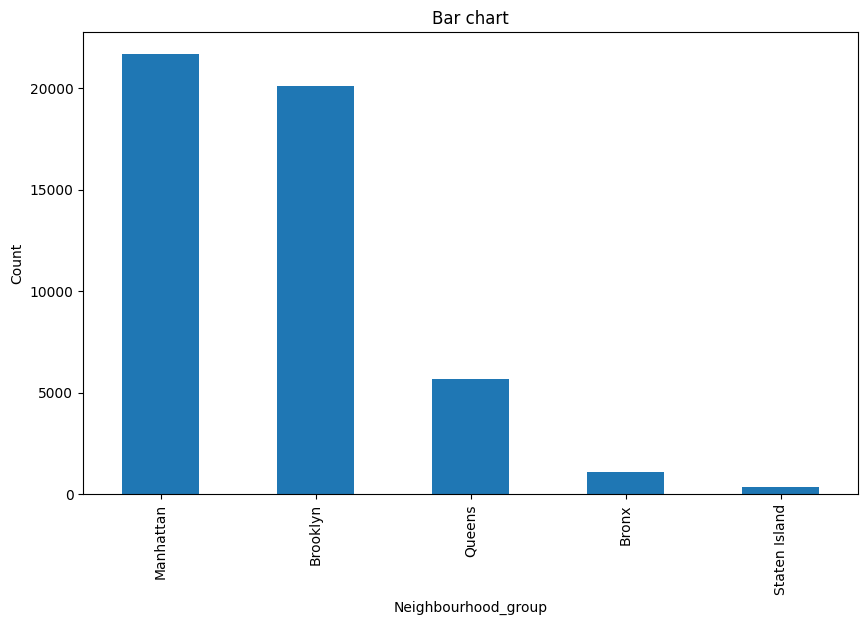

In [51]:
plt.figure(figsize=(10, 6))
df['neighbourhood_group'].value_counts().plot(kind='bar')
plt.title('Bar chart')
plt.xlabel('Neighbourhood_group')
plt.ylabel('Count')
plt.show()

### 2. Histogram

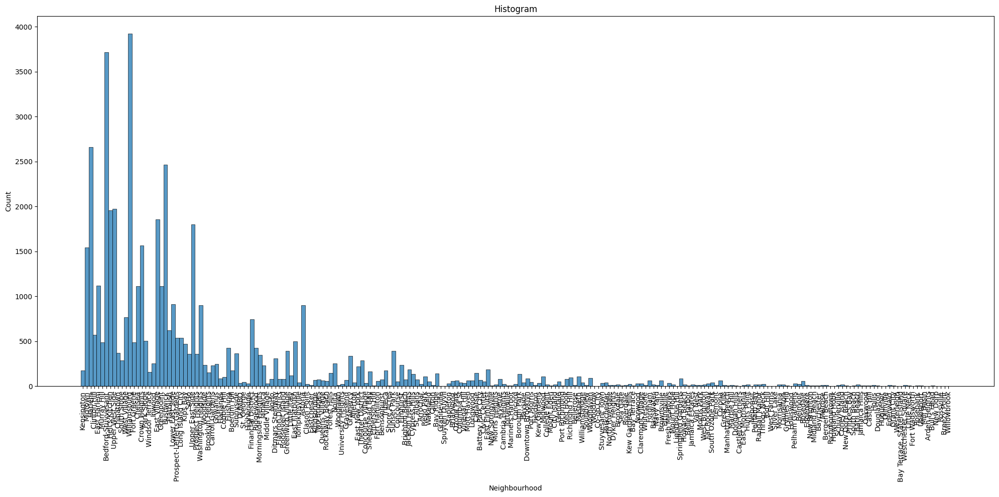

In [52]:
plt.figure(figsize=(20, 10))
sns.histplot(data=df, x='neighbourhood', stat='count', discrete=True)
plt.title('Histogram')
plt.xlabel('Neighbourhood')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### 3. Relationship between Availability/year and Neighbourhood Group

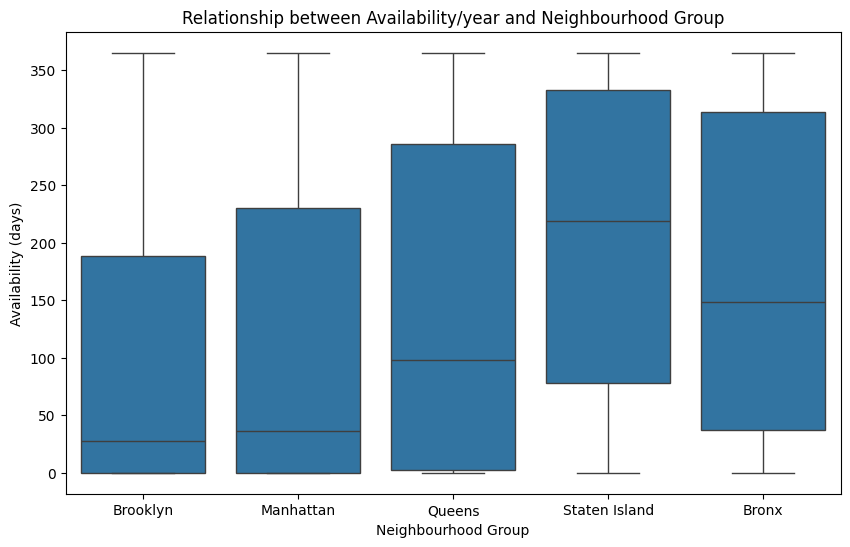

In [53]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='neighbourhood_group', y='availability_365', data=df)
plt.title('Relationship between Availability/year and Neighbourhood Group')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Availability (days)')
plt.show()

### 4. Scatter plot map of neighborhood_group using longitude and latitude

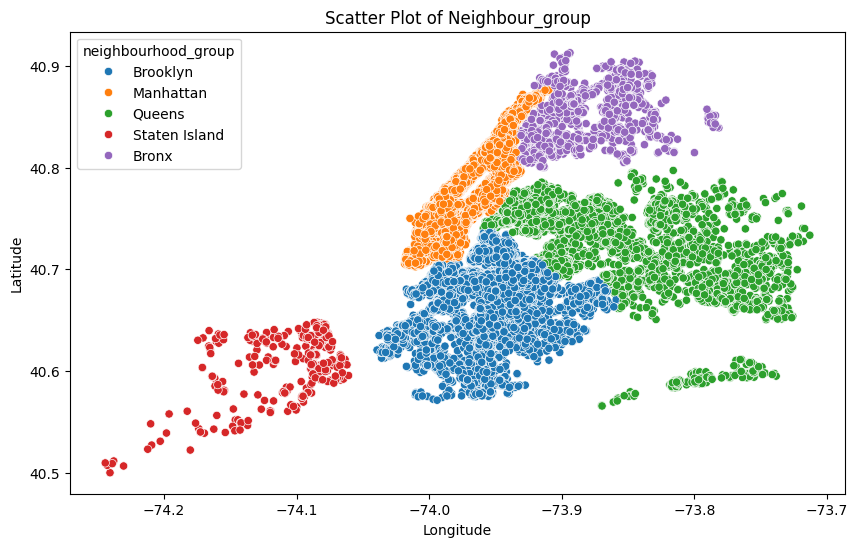

In [54]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='longitude', y='latitude', hue='neighbourhood_group')
plt.title('Scatter Plot of Neighbour_group')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

### 5. Use heatmap to represent the correlation between all the attributes in the data

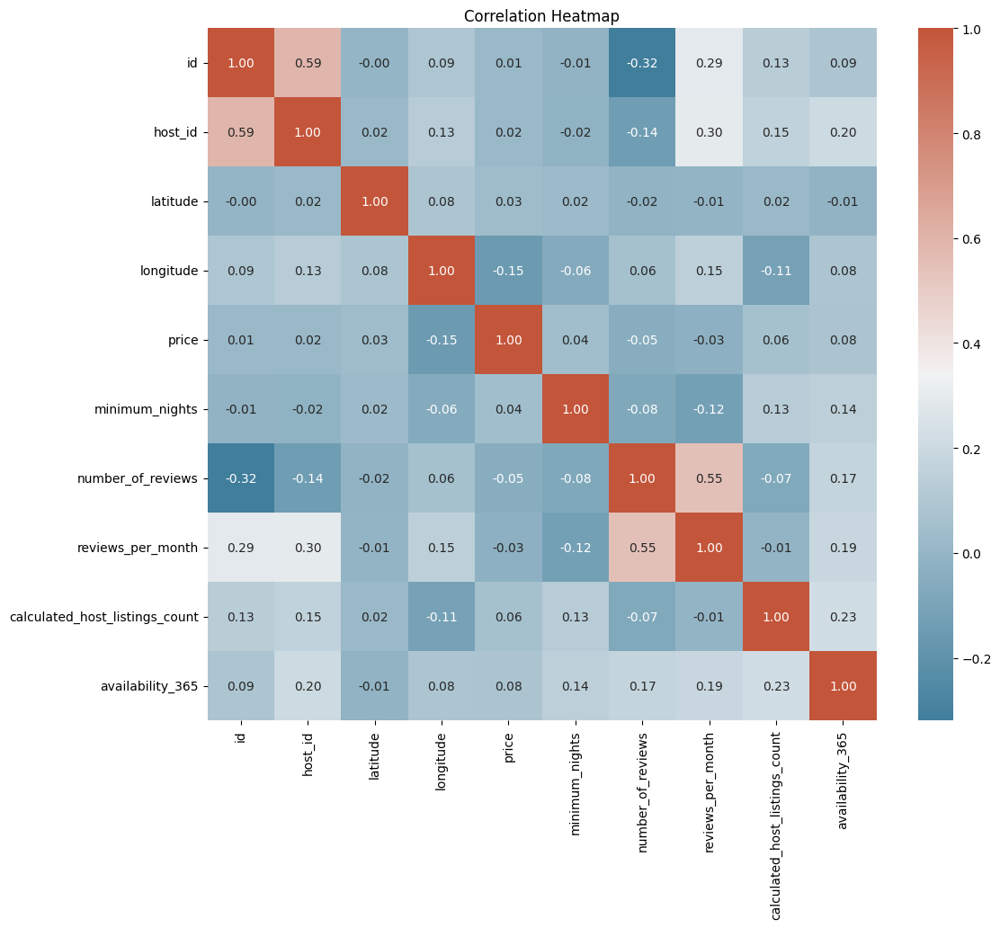

In [55]:
# Chọn các cột số
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(df[numeric_cols].corr(), annot=True, cmap=cmap, fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

## 6. Use plotly to plot room rate data on a map

In [56]:
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", color="price",
                        size="price", hover_name="name", hover_data=["room_type", "price"],
                        color_continuous_scale=px.colors.cyclical.IceFire, size_max=10, zoom=10)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()